<a href="https://colab.research.google.com/github/GhsJahanmir/TransferLearning/blob/main/vggnet_with_Kaggle_Homedataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


# importing VGG16 available on Keras

In [22]:
pip install keras_applications

In [23]:
pip install tensorflow

In [24]:
import tensorflow as tf
print("TensorFlow version:", tf.__version__)

TensorFlow version: 2.12.0


In [25]:
from __future__ import print_function

import numpy as np
import warnings

from keras.models import Model
from keras.layers import Flatten
from keras.layers import Dense
from keras.layers import Input
from keras.layers import Conv2D
from keras.layers import MaxPooling2D
from keras.layers import GlobalMaxPooling2D
from keras.layers import GlobalAveragePooling2D
from tensorflow.keras.preprocessing import image
from keras.utils import layer_utils
from keras.utils.data_utils import get_file
from keras import backend as K
from keras.applications.imagenet_utils import decode_predictions
from keras.applications.imagenet_utils import preprocess_input
#from tensorflow.keras.applications.imagenet_utils import obtain_input_shape # this will work for older versions of keras. 2.2.0 or before
from keras_applications.imagenet_utils import _obtain_input_shape
#from keras.engine.topology import get_source_inputs
from keras.utils.layer_utils import get_source_inputs


In [26]:
from keras.applications.vgg16 import VGG16
model=VGG16()
#

In [27]:
model.summary()
# in the input layer, The default  size for VGG16 model is 224 x 224 pixels with 3 channels for RGB image.(color)
#VGG16 uses multiple 3×3 kernel-sized filters one after another with a stride 1 and always used same padding and maxpool layer of 2x2 filter of stride 2.
#the third number in the Conv2D shape  (in first layer after input layer, 64, is number of filter layers (with size of 3*3))

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [28]:
from keras.preprocessing import image
#from keras.applications import preprocess_input
from tensorflow.keras.applications.imagenet_utils import preprocess_input
from tensorflow.keras.utils import load_img, img_to_array

## *Take image and test it* *italicized text*

Input image shape: (1, 224, 224, 3)


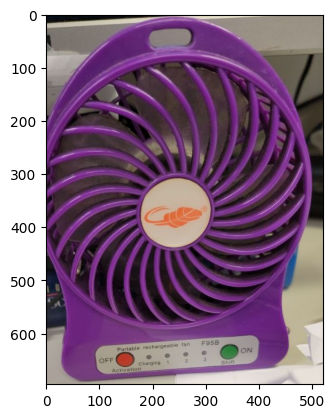

In [29]:
from matplotlib.pyplot import imread
from matplotlib.pyplot import imshow
img_path = 'fan.jpg'

#img = image.load_img(img_path, target_size=(224, 224)) #(original VGG16 requirement)
img = load_img(img_path, target_size=(224, 224)) #(original VGG16 requirement)

image1 = img_to_array(img) #to be processable by algorithm
image1 = np.expand_dims(image1, axis=0) # add one extra dimension to the specified axis
#here from(224,224,3) expanded to (1,224,224,3)
"""
it is common to use this technique when working with single samples or
 images to ensure compatibility with models that expect batch inputs.
Adding the extra dimension allows you to treat the single sample as a batch of size one.
"""
#prepare the image for the VGG model
image1 = preprocess_input(image1)

print('Input image shape:', image1.shape)

my_image = imread(img_path)
imshow(my_image)

### predict what is inside this image by VGG16

In [30]:
from keras.applications.vgg16 import decode_predictions
#Predict first the probability maps of list of objects
y_image = model.predict(image1)

predicted_class_label = decode_predictions(y_image)
# this picture belongs to which particular class of objects
predicted_class_label
# the result top 5 highest probabilities

#  31.16243%  image belong to electric_fan
# and so on

1/1 [==============================] - 0s 151ms/step


[[('n03271574', 'electric_fan', 0.3116243),
  ('n04265275', 'space_heater', 0.11684261),
  ('n03483316', 'hand_blower', 0.07326909),
  ('n04330267', 'stove', 0.055218052),
  ('n03065424', 'coil', 0.04803054)]]

### test for another object

Input image shape: (1, 224, 224, 3)
1/1 [==============================] - 0s 20ms/step


[[('n03063599', 'coffee_mug', 0.5915417),
  ('n07930864', 'cup', 0.08389373),
  ('n04357314', 'sunscreen', 0.08353503),
  ('n03690938', 'lotion', 0.070117965),
  ('n02823750', 'beer_glass', 0.029933037)]]

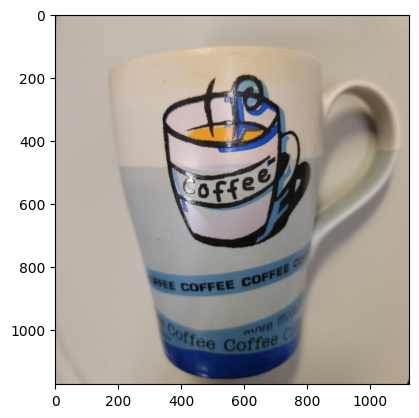

In [31]:
img_path = 'cup.jpg'

img = load_img(img_path, target_size=(224, 224)) #(original VGG16 requirement)

image1 = img_to_array(img) #to be processable by algorithm
image1 = np.expand_dims(image1, axis=0) # add one extra dimension to the specified axis
#here from(224,224,3) expanded to (1,224,224,3)

#prepare the image for the VGG model
image1 = preprocess_input(image1)

print('Input image shape:', image1.shape)

my_image = imread(img_path)
imshow(my_image)
## prediction
y_image = model.predict(image1)

predicted_class_label = decode_predictions(y_image)
# this picture belongs to which particular class of objects
predicted_class_label

# VGGNET With Keras on our own Dataset

Input image shape: (1, 224, 224, 3)
1/1 [==============================] - 0s 19ms/step


[[('n03793489', 'mouse', 0.47965968),
  ('n03085013', 'computer_keyboard', 0.27501547),
  ('n04074963', 'remote_control', 0.047477476),
  ('n06785654', 'crossword_puzzle', 0.029391795),
  ('n03180011', 'desktop_computer', 0.021698292)]]

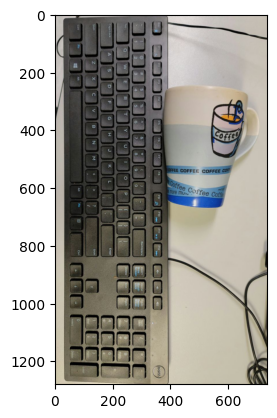

In [32]:
img_path = 'cup_keyboard.jpg'

img = load_img(img_path, target_size=(224, 224)) #(original VGG16 requirement)

image1 = img_to_array(img) #to be processable by algorithm
image1 = np.expand_dims(image1, axis=0) # add one extra dimension to the specified axis
#here from(224,224,3) expanded to (1,224,224,3)

#prepare the image for the VGG model
image1 = preprocess_input(image1)

print('Input image shape:', image1.shape)

my_image = imread(img_path)
imshow(my_image)
## prediction
y_image = model.predict(image1)

predicted_class_label = decode_predictions(y_image)
# this picture belongs to which particular class of objects
predicted_class_label

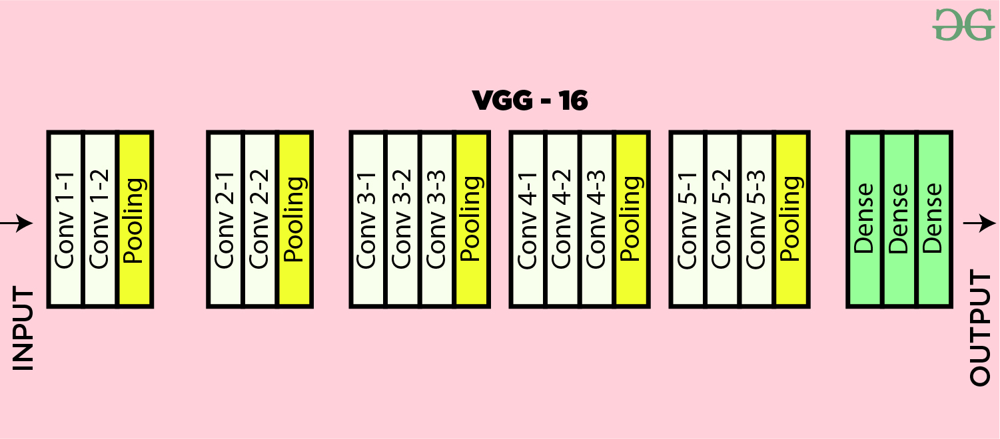

here we simply want to make changes to the original VGG,
1-input image is 300*300
2-filter size

In [33]:
def VGGupdated(input_tensor=None,classes=2):
 #  classes=2  our output function is binary classification
    img_rows, img_cols = 300, 300   # by default size is 224,224
    img_channels = 3  # color image

    img_dim = (img_rows, img_cols, img_channels)

    img_input = Input(shape=img_dim)  # we will get this from user

    # Block 1
    #(according to above diagram  in first and second block we have 3 layers :
    #two convolutional layers and 1 pooling layer)
    x = Conv2D(64, (3, 3), activation='relu', padding='same', name='block1_conv1')(img_input)
    #64= no. of filter   filter size=3*3
    #'padding=same'
    """
    In the context of defining a Conv2D layer in a convolutional neural network (CNN),
     the parameter padding='same' refers to a padding technique applied to the input image.

    Padding is the process of adding additional pixels around the input image,
    which helps retain spatial dimensions during convolutional operations.
    The 'same' padding ensures that the output feature map has the same spatial dimensions (height and width) as the input.

    When padding='same' is specified, the Conv2D layer pads the input image with zeros in such a way that the output feature map has
    the same height and width as the input."""

    #(x) become input of second layer
    x = Conv2D(64, (3, 3), activation='relu', padding='same', name='block1_conv2')(x)
    x = MaxPooling2D((2, 2), strides=(2, 2), name='block1_pool')(x)

    # Block 2
    x = Conv2D(128, (3, 3), activation='relu', padding='same', name='block2_conv1')(x)
    x = Conv2D(128, (3, 3), activation='relu', padding='same', name='block2_conv2')(x)
    x = MaxPooling2D((2, 2), strides=(2, 2), name='block2_pool')(x)
       #MaxPooling2D  The pooling operation reduces the spatial dimensions of the input tensor by a factor of 2 in both the height and width dimensions.
       #Maxpool: among the 2*2 section on the image, it will chose the max value
    # Block 3
    x = Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv1')(x)
    x = Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv2')(x)
    x = Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv3')(x)
    x = MaxPooling2D((2, 2), strides=(2, 2), name='block3_pool')(x)
    """
    I dont understand this part, the output of this image is 256 filtered images which will be inputted to the
     next block????"""
    # Block 4
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv1')(x)
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv2')(x)
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv3')(x)
    x = MaxPooling2D((2, 2), strides=(2, 2), name='block4_pool')(x)

    # Block 5
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv1')(x)
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv2')(x)
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv3')(x)
    x = MaxPooling2D((2, 2), strides=(2, 2), name='block5_pool')(x)


    # Classification block
    x = Flatten(name='flatten')(x)
    #last three fully connected layers
    #this layers will have 4096 neurons
    x = Dense(4096, activation='relu', name='fc1')(x)
    x = Dense(4096, activation='relu', name='fc2')(x)
    #in the last layer, we have neurons as the size of classes or labels we want
    #here in this example is 2
    """activation='softmax'  means the softmax activation function is applied to the output of the layer.
    #The output of this layer will be a vector of probabilities representing the likelihood of the input
    #belonging to each class (here we have 2 classes).
    It takes a vector of real-valued numbers as input and transforms them into a probability distribution over
    multiple classes.The function exponentiates each input element and normalizes the values to ensure they sum up to 1.
    """
    x = Dense(classes, activation='softmax', name='predictions')(x)

    # Create model.

    # Model is a  class in the Keras library,
    #which is used to create a model that connects a set of input tensors to a set of output tensors.
    model = Model(inputs = img_input, outputs = x, name='VGGdemo')


    return model



In [34]:
model = VGGupdated(classes = 2) # bedroom and diningroom

In [35]:

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [36]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [37]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os

""""
I am using room dataset from kaggle and store it on my google drive then i can retrieve them using the following link
"""
path = "/content/drive/MyDrive/Colab Notebooks/Home_dataset"
dataset_path = os.listdir(path) # list of all the folder inside he 'rooms_dataset' folder

room_types = os.listdir(path)
print (room_types)  #what kinds of rooms are in this dataset

print("Types of rooms found: ", len(dataset_path))



['bedroom', 'diningroom']
Types of rooms found:  2


In [38]:
print (room_types)

['bedroom', 'diningroom']


In [39]:
#have the images of both folder in a single list
rooms = []

for item in room_types:
 # Get all the file names
 all_rooms = os.listdir(path + '/' +item)
 # Add them to the list
 for room in all_rooms:
    rooms.append((item, str(path + '/' +item) + '/' + room))
    #print(rooms)

print(rooms)



[('bedroom', '/content/drive/MyDrive/Colab Notebooks/Home_dataset/bedroom/bed_1279.jpg'), ('bedroom', '/content/drive/MyDrive/Colab Notebooks/Home_dataset/bedroom/bed_1276.jpg'), ('bedroom', '/content/drive/MyDrive/Colab Notebooks/Home_dataset/bedroom/bed_1267.jpg'), ('bedroom', '/content/drive/MyDrive/Colab Notebooks/Home_dataset/bedroom/bed_1268.jpg'), ('bedroom', '/content/drive/MyDrive/Colab Notebooks/Home_dataset/bedroom/bed_1266.jpg'), ('bedroom', '/content/drive/MyDrive/Colab Notebooks/Home_dataset/bedroom/bed_1287.jpg'), ('bedroom', '/content/drive/MyDrive/Colab Notebooks/Home_dataset/bedroom/bed_1270.jpg'), ('bedroom', '/content/drive/MyDrive/Colab Notebooks/Home_dataset/bedroom/bed_1286.jpg'), ('bedroom', '/content/drive/MyDrive/Colab Notebooks/Home_dataset/bedroom/bed_1281.jpg'), ('bedroom', '/content/drive/MyDrive/Colab Notebooks/Home_dataset/bedroom/bed_1275.jpg'), ('bedroom', '/content/drive/MyDrive/Colab Notebooks/Home_dataset/bedroom/bed_1273.jpg'), ('bedroom', '/conten

In [40]:

# Build a dataframe
rooms_df = pd.DataFrame(data=rooms, columns=['room type', 'image'])
print(rooms_df.head(10))
#print(rooms_df.tail())


  room type                                              image
0   bedroom  /content/drive/MyDrive/Colab Notebooks/Home_da...
1   bedroom  /content/drive/MyDrive/Colab Notebooks/Home_da...
2   bedroom  /content/drive/MyDrive/Colab Notebooks/Home_da...
3   bedroom  /content/drive/MyDrive/Colab Notebooks/Home_da...
4   bedroom  /content/drive/MyDrive/Colab Notebooks/Home_da...
5   bedroom  /content/drive/MyDrive/Colab Notebooks/Home_da...
6   bedroom  /content/drive/MyDrive/Colab Notebooks/Home_da...
7   bedroom  /content/drive/MyDrive/Colab Notebooks/Home_da...
8   bedroom  /content/drive/MyDrive/Colab Notebooks/Home_da...
9   bedroom  /content/drive/MyDrive/Colab Notebooks/Home_da...


In [41]:

# Let's check how many samples for each category are present
#room type is the label of data (Y)
print("Total number of rooms in the dataset: ", len(rooms_df))

room_count = rooms_df['room type'].value_counts()

print("rooms in each category: ")
print(room_count)


Total number of rooms in the dataset:  2406
rooms in each category: 
bedroom       1248
diningroom    1158
Name: room type, dtype: int64


In [42]:
import cv2
path = path+'/'

#we need to resize all the images to 300*300
im_size = 300

# store all the images and labels in different lists
images = []
labels = []

for i in room_types:
    data_path = path + str(i)
    filenames = [i for i in os.listdir(data_path) ]
    #print(filenames)
    for f in filenames:
     img = cv2.imread(data_path + '/' + f)
     img = cv2.resize(img, (im_size, im_size))
     images.append(img)
     labels.append(i)

In [43]:
print(images)

[array([[[141, 150, 153],
        [138, 147, 150],
        [136, 145, 148],
        ...,
        [169, 169, 169],
        [171, 171, 171],
        [172, 172, 172]],

       [[127, 138, 140],
        [125, 136, 138],
        [124, 135, 137],
        ...,
        [159, 159, 159],
        [160, 160, 160],
        [161, 161, 161]],

       [[122, 134, 136],
        [120, 133, 135],
        [119, 132, 134],
        ...,
        [153, 153, 153],
        [154, 154, 154],
        [155, 155, 155]],

       ...,

       [[108, 134, 160],
        [106, 133, 157],
        [109, 135, 160],
        ...,
        [ 11,  26,  74],
        [ 12,  27,  76],
        [ 16,  32,  82]],

       [[109, 136, 162],
        [107, 134, 159],
        [110, 137, 161],
        ...,
        [ 13,  29,  74],
        [ 10,  26,  73],
        [ 11,  28,  77]],

       [[112, 139, 165],
        [109, 137, 162],
        [112, 139, 164],
        ...,
        [ 17,  34,  77],
        [  8,  25,  71],
        [  5,  23,  70]

In [44]:
print(labels)

['bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom'

In [45]:
import cv2
im_size = 300
# store all the images and labels in different lists
images2 = []
labels2 = []
for i2 in range(len(rooms_df)):
  img_path=rooms_df.iloc[i2]['image']
  img2 = cv2.imread(img_path)
  img2 = cv2.resize(img2, (im_size, im_size))
  images2.append(img2)
  labels2.append(i2)

In [46]:
print(images)

[array([[[141, 150, 153],
        [138, 147, 150],
        [136, 145, 148],
        ...,
        [169, 169, 169],
        [171, 171, 171],
        [172, 172, 172]],

       [[127, 138, 140],
        [125, 136, 138],
        [124, 135, 137],
        ...,
        [159, 159, 159],
        [160, 160, 160],
        [161, 161, 161]],

       [[122, 134, 136],
        [120, 133, 135],
        [119, 132, 134],
        ...,
        [153, 153, 153],
        [154, 154, 154],
        [155, 155, 155]],

       ...,

       [[108, 134, 160],
        [106, 133, 157],
        [109, 135, 160],
        ...,
        [ 11,  26,  74],
        [ 12,  27,  76],
        [ 16,  32,  82]],

       [[109, 136, 162],
        [107, 134, 159],
        [110, 137, 161],
        ...,
        [ 13,  29,  74],
        [ 10,  26,  73],
        [ 11,  28,  77]],

       [[112, 139, 165],
        [109, 137, 162],
        [112, 139, 164],
        ...,
        [ 17,  34,  77],
        [  8,  25,  71],
        [  5,  23,  70]

In [47]:
print(labels)


['bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom', 'bedroom'

In [48]:
img2.shape

(300, 300, 3)

In [49]:
#convert imgages into array
images = np.array(images)
#pixel intensities ranges between 0 and 255
images = images.astype('float32') / 255.0
images.shape
#images is a list contains 40 images

(2406, 300, 300, 3)

In [50]:
#we need to label encoding
#LabelEncoder provide numeric values for each categorries like bedroom 0 and diningroom 1 ...
#One hot encoding generates binary columns for each category


#Path1: use label encoder first then OneHotEncoder
from sklearn.preprocessing import LabelEncoder , OneHotEncoder
y=rooms_df['room type'].values
#print(y[:5])

y_labelencoder = LabelEncoder ()
y = y_labelencoder.fit_transform (y)
print (y)
type(y)

[0 0 0 ... 1 1 1]


numpy.ndarray

In [51]:
y=y.reshape(-1,1)
print(y.shape)

(2406, 1)


In [52]:
y=y.reshape(-1,1)   #because the OneHotEncoder expects a 2D array as input. (nowit is become 40*1)
# Create an instance of the OneHotEncoder
encoder = OneHotEncoder(sparse=False)
Y= encoder.fit_transform(y)
print(Y)
Y.shape  #(40, 2)


[[1. 0.]
 [1. 0.]
 [1. 0.]
 ...
 [0. 1.]
 [0. 1.]
 [0. 1.]]


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


(2406, 2)

In [53]:
#Path2:
#Directly use one-hot encoding usign get-dummies
df_onehot = pd.get_dummies(rooms_df['room type'])
Y=df_onehot.values
print(Y.shape)
print(Y)

(2406, 2)
[[1 0]
 [1 0]
 [1 0]
 ...
 [0 1]
 [0 1]
 [0 1]]


# **#prepare the dataset for modeling**

In [54]:
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split


images, Y = shuffle(images, Y, random_state=1)

train_x, test_x, train_y, test_y = train_test_split(images, Y, test_size=0.05, random_state=2)

#inpect the shape of the training and testing.
print(train_x.shape)
print(train_y.shape)
print(test_x.shape)
print(test_y.shape)

(2285, 300, 300, 3)
(2285, 2)
(121, 300, 300, 3)
(121, 2)


In [55]:
history = model.fit(train_x, train_y, epochs = 30, batch_size = 32)

Epoch 1/30
72/72 [==============================] - 100s 942ms/step - loss: 0.9380 - accuracy: 0.5059
Epoch 2/30
72/72 [==============================] - 57s 798ms/step - loss: 0.6927 - accuracy: 0.5173
Epoch 3/30
72/72 [==============================] - 58s 804ms/step - loss: 0.6929 - accuracy: 0.5173
Epoch 4/30
72/72 [==============================] - 57s 798ms/step - loss: 0.6931 - accuracy: 0.5173
Epoch 5/30
72/72 [==============================] - 57s 797ms/step - loss: 0.6928 - accuracy: 0.5173
Epoch 6/30
72/72 [==============================] - 57s 796ms/step - loss: 0.6928 - accuracy: 0.5173
Epoch 7/30
72/72 [==============================] - 57s 796ms/step - loss: 0.6926 - accuracy: 0.5173
Epoch 8/30
72/72 [==============================] - 57s 796ms/step - loss: 0.6928 - accuracy: 0.5173
Epoch 9/30
72/72 [==============================] - 57s 797ms/step - loss: 0.6927 - accuracy: 0.5173
Epoch 10/30
72/72 [==============================] - 57s 796ms/step - loss: 0.6927 - accur

In [56]:
preds = model.evaluate(test_x, test_y)
#This is a method of the Keras model object that computes the evaluation metrics of the model on a given dataset.
print ("Loss = " + str(preds[0]))
print ("Test Accuracy = " + str(preds[1]))

4/4 [==============================] - 8s 2s/step - loss: 0.6906 - accuracy: 0.5455
Loss = 0.6905949115753174
Test Accuracy = 0.5454545617103577


# Take input from User and Classify that image

Input image shape: (1, 300, 300, 3)


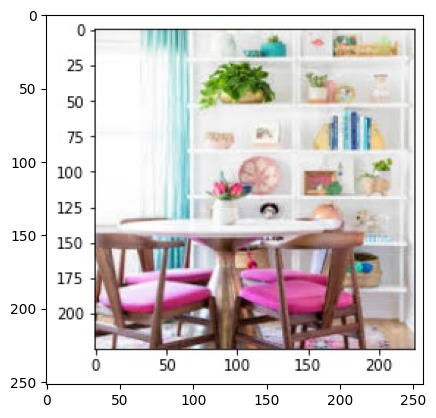

In [60]:
from matplotlib.pyplot import imread
from matplotlib.pyplot import imshow

img_path = 'test_img.jpg'

img = load_img(img_path, target_size=(300, 300))

x = img_to_array(img)
x = np.expand_dims(x, axis=0)
x = preprocess_input(x)

print('Input image shape:', x.shape)

my_image = imread(img_path)
imshow(my_image)

In [61]:
print(model.predict(x))

1/1 [==============================] - 1s 1s/step
[[2.9183816e-16 1.0000000e+00]]


Input image shape: (1, 300, 300, 3)


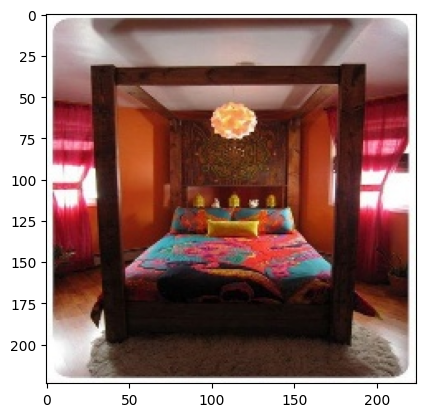

In [62]:
from matplotlib.pyplot import imread
from matplotlib.pyplot import imshow

img_path = 'bed_249.jpg'

img = load_img(img_path, target_size=(300, 300))

x = img_to_array(img)
x = np.expand_dims(x, axis=0)
x = preprocess_input(x)

print('Input image shape:', x.shape)

my_image = imread(img_path)
imshow(my_image)

In [63]:
print(model.predict(x))

1/1 [==============================] - 0s 363ms/step
[[7.7239354e-13 1.0000000e+00]]


In [ ]:
[[0.44196206 0.55803794]]